## Libraries

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
from pandas import ExcelFile
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,auc
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

## Import Dataframe

In [3]:
df = pd.read_excel("/home/lenovo/Scrivania/Lab_Machine_Learning/Progetto/Dat.xlsx") 
df5=pd.read_csv("/home/lenovo/Scrivania/Lab_Machine_Learning/Progetto/dat_weight.csv",sep=';',decimal=',') 
df.shape

(11449, 36)

In [130]:
df.H_STL.describe()

count    11449.000000
mean         5.100491
std          1.094831
min          1.200000
25%          4.350000
50%          5.075000
75%          5.825000
max          8.950000
Name: H_STL, dtype: float64

In [331]:
df.duplicated().describe()#controllo se ci sono duplicati in caso fossero presenti usare .drop_duplicates()

count     11449
unique        1
top       False
freq      11449
dtype: object

In [332]:
df.dropna().shape# Controllo la dimensione del dataset senza le osservazioni con NaN 

(11449, 36)

In [114]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11978 entries, 0 to 11977
Data columns (total 37 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   GAME_ID         11978 non-null  int64  
 1   GAME_DATE_EST   11978 non-null  object 
 2   H_NICKNAME      11978 non-null  object 
 3   A_NICKNAME      11978 non-null  object 
 4   HOME_TEAM_WINS  11978 non-null  int64  
 5   H_Time          11978 non-null  float64
 6   H_FGM           11978 non-null  float64
 7   H_FGA           11978 non-null  float64
 8   H_FG3M          11978 non-null  float64
 9   H_FG3A          11978 non-null  float64
 10  H_FTM           11978 non-null  float64
 11  H_FTA           11978 non-null  float64
 12  H_OREB          11978 non-null  float64
 13  H_DREB          11978 non-null  float64
 14  H_AST           11978 non-null  float64
 15  H_STL           11978 non-null  float64
 16  H_BLK           11978 non-null  float64
 17  H_TO            11978 non-null 

## Slicing

In [28]:
df.set_index("GAME_DATE_EST")#ATTENZIONE NON LO SALVA NEL DATAFRAME ORIGINALE , per salvarlo aggiungere il parametro inplace=True

,H_NICKNAME,A_NICKNAME,HOME_TEAM_WINS,H_Time,H_FGM,H_FGA,H_FG3M,H_FG3A,H_FTM,H_FTA,...,A_FTA,A_OREB,A_DREB,A_AST,A_STL,A_BLK,A_TO,A_PF,A_PLUS_MINUS,A_team_PTS-
GAME_DATE_EST,,,,,,,,,,,,,,,,,,,,,
2010-01-18,Lakers,Magic,1,10684.750,27.650,59.275,4.100,12.100,14.400,18.550,...,18.650,5.850,20.175,7.400,3.425,3.375,7.750,11.300,13.550,72.391667
2010-01-19,Cavaliers,Raptors,1,10417.975,26.600,54.175,5.600,13.400,14.025,18.450,...,21.425,6.100,21.800,16.950,3.350,3.275,9.275,13.725,-1.550,94.970833
2010-01-20,Hawks,Kings,1,11563.425,32.475,68.500,5.700,15.600,14.400,18.900,...,17.400,7.575,21.225,14.550,4.100,3.125,10.100,14.750,-12.575,101.591667
2010-01-20,Suns,Nets,1,10884.275,30.875,62.700,7.275,17.600,14.400,17.875,...,14.225,5.875,15.350,9.350,3.650,2.875,7.375,9.775,-34.075,79.354167
2010-01-20,76ers,Trail Blazers,0,10196.575,25.750,55.100,3.475,9.925,12.225,15.850,...,16.200,5.100,15.625,15.250,3.525,1.075,7.250,9.875,12.925,76.095833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-04-10,Hornets,Magic,0,8761.500,24.725,55.325,7.175,20.425,12.025,14.325,...,12.850,5.925,23.400,19.375,4.250,2.325,8.925,9.475,18.100,88.620833
2019-04-10,Knicks,Pistons,0,9034.900,22.325,50.825,5.900,17.500,9.250,13.175,...,12.150,7.475,20.550,13.050,4.625,2.325,6.400,10.975,7.875,106.216667
2019-04-10,Trail Blazers,Kings,1,8820.350,20.400,45.800,6.500,18.925,10.725,12.175,...,17.800,6.775,22.650,18.075,5.550,2.475,8.400,11.900,-1.875,102.162500


In [12]:
df.loc[0]#Estrae seconda l'indicizzazione indicata (colonna 0), cambiando indicizzazione come prima ovvviamente cambia lo slicing

GAME_DATE_EST     2010-01-18 00:00:00
H_NICKNAME                     Lakers
A_NICKNAME                      Magic
HOME_TEAM_WINS                      1
H_Time                       10684.75
H_FGM                           27.65
H_FGA                          59.275
H_FG3M                            4.1
H_FG3A                           12.1
H_FTM                            14.4
H_FTA                           18.55
H_OREB                            8.1
H_DREB                          24.05
H_AST                          15.775
H_STL                            5.15
H_BLK                           3.575
H_TO                            9.675
H_PF                           12.975
H_PLUS_MINUS                   34.975
H_TEAM_PTS-                 83.808333
A_Time                         9348.8
A_FGM                          18.575
A_FGA                          39.425
A_FG3M                          4.225
A_FG3A                           12.9
A_FTM                          12.775
A_FTA       

In [23]:
df.iloc[0:2,1:3]#Indice da 0 a 1 , variabile da 1 a 2

,H_NICKNAME,A_NICKNAME
0,Lakers,Magic
1,Cavaliers,Raptors


In [27]:
df[df.HOME_TEAM_WINS==1].iloc[:,1:3].head(10)#Estraggo i casi in cui vince l 'home team e mostro i teams (mostro i primi 10) 

,H_NICKNAME,A_NICKNAME
0,Lakers,Magic
1,Cavaliers,Raptors
2,Hawks,Kings
3,Suns,Nets
6,Pelicans,Grizzlies
9,Magic,Pacers
10,Nuggets,Clippers
11,Cavaliers,Lakers
12,Grizzlies,Thunder
13,Hawks,Hornets


In [37]:
#np.random.seed(123) 
df.sample(10)#Estraggo 10 osservazioni randomicamente (distribuzione uniforme)

,GAME_DATE_EST,H_NICKNAME,A_NICKNAME,HOME_TEAM_WINS,H_Time,H_FGM,H_FGA,H_FG3M,H_FG3A,H_FTM,...,A_FTA,A_OREB,A_DREB,A_AST,A_STL,A_BLK,A_TO,A_PF,A_PLUS_MINUS,A_team_PTS-
3087,2012-12-03,Pistons,Cavaliers,1,9809.975,23.225,53.300,3.100,8.775,12.050,...,12.875,9.550,17.350,10.225,4.275,1.750,8.375,10.125,-12.575,89.545833
6947,2015-12-22,Heat,Pistons,0,9377.475,27.825,59.350,5.175,14.225,12.225,...,22.950,10.075,25.075,19.775,6.850,2.675,10.850,13.275,19.625,100.116667
3564,2013-02-06,Hawks,Grizzlies,1,10170.075,25.525,54.050,5.800,14.525,8.250,...,15.625,11.700,24.175,15.025,6.575,3.950,9.425,12.900,10.250,91.729167
10146,2018-04-03,Cavaliers,Raptors,1,9561.075,31.600,65.200,7.925,21.950,14.550,...,15.000,5.800,20.600,16.050,3.300,3.000,7.500,10.700,16.000,81.204167
7994,2016-11-25,Knicks,Hornets,1,9020.325,23.950,53.700,4.650,13.050,9.400,...,17.850,6.900,25.700,16.375,4.725,3.825,7.425,10.775,21.225,98.933333
8653,2017-03-01,Celtics,Cavaliers,1,11181.350,33.925,73.900,11.625,30.650,17.250,...,17.500,6.700,21.575,23.750,5.175,2.475,11.150,11.225,15.600,106.137500
8673,2017-03-03,Mavericks,Grizzlies,1,8678.350,24.225,51.100,5.475,14.075,9.125,...,17.350,8.475,23.150,16.150,5.700,2.350,8.950,12.600,2.250,100.325000
1512,2011-03-01,Raptors,Pelicans,1,10492.525,28.475,59.450,2.900,9.375,12.000,...,21.800,9.450,23.725,16.400,5.875,3.475,9.850,14.625,8.225,94.720833
883,2010-12-01,Celtics,Trail Blazers,1,10637.950,28.725,55.775,3.350,8.800,14.550,...,19.175,9.600,20.000,16.100,6.175,3.700,8.625,12.925,20.025,87.483333
7307,2016-02-08,Timberwolves,Pelicans,0,10032.975,24.175,51.025,2.175,7.825,13.025,...,15.225,5.400,19.450,15.975,4.975,3.225,8.575,10.025,-1.975,102.008333


In [41]:
df.sample(frac=0.2).shape #Estraggo il 20% delle osservazioni 

(2290, 36)

In [57]:
df["minuti"]=df.H_Time/60 #Aggiungo la variabile minuti come 37-esima colonna 
df.iloc[0:2,36]

0    178.079167
1    173.632917
Name: minuti, dtype: float64

In [58]:
del df["minuti"]# Rimuove la colonna minuti 
df.shape

(11449, 36)

In [358]:
df.iloc[:,4]

9936      8651.400
11236    10201.275
1903      9302.525
8443     10100.700
1831      9714.275
           ...    
11308    10103.400
1454     10269.675
3303     10178.475
990      10932.450
6672      9599.175
Name: H_Time, Length: 11449, dtype: float64

['GAME_DATE_EST', 'H_NICKNAME', 'A_NICKNAME', 'HOME_TEAM_WINS', 'H_Time',
       'H_FGM', 'H_FGA', 'H_FG3M', 'H_FG3A', 'H_FTM', 'H_FTA', 'H_OREB',
       'H_DREB', 'H_AST', 'H_STL', 'H_BLK', 'H_TO', 'H_PF', 'H_PLUS_MINUS',
       'H_TEAM_PTS-', 'A_Time', 'A_FGM', 'A_FGA', 'A_FG3M', 'A_FG3A', 'A_FTM',
       'A_FTA', 'A_OREB', 'A_DREB', 'A_AST', 'A_STL', 'A_BLK', 'A_TO', 'A_PF',
       'A_PLUS_MINUS', 'A_team_PTS-']

In [220]:
df.iloc[:,10:].describe()

,H_FTA,H_OREB,H_DREB,H_AST,H_STL,H_BLK,H_TO,H_PF,H_PLUS_MINUS,H_TEAM_PTS-,...,A_FTA,A_OREB,A_DREB,A_AST,A_STL,A_BLK,A_TO,A_PF,A_PLUS_MINUS,A_team_PTS-
count,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,...,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000,11449.000000
mean,16.660237,6.621310,21.263591,15.931632,5.100491,3.066316,9.349537,11.936604,3.049393,95.304907,...,16.636167,6.628570,21.262187,15.907686,5.091148,3.070253,9.337505,11.926384,3.258095,95.247418
std,3.884342,1.736304,3.773200,3.533010,1.094831,0.951365,1.613159,1.754990,16.524966,9.490906,...,3.883022,1.736776,3.759726,3.515026,1.095822,0.953760,1.610888,1.752900,16.534673,9.454370
min,3.500000,1.700000,5.875000,4.025000,1.200000,0.525000,2.425000,4.300000,-51.700000,48.820833,...,3.250000,1.150000,7.775000,3.625000,1.250000,0.250000,2.875000,4.750000,-48.800000,52.050000
25%,14.025000,5.425000,18.825000,13.700000,4.350000,2.400000,8.325000,10.775000,-8.825000,89.641667,...,13.975000,5.450000,18.825000,13.725000,4.325000,2.400000,8.275000,10.750000,-8.825000,89.595833
50%,16.525000,6.500000,21.500000,16.025000,5.075000,3.000000,9.400000,12.025000,2.075000,96.766667,...,16.500000,6.525000,21.475000,15.975000,5.050000,3.025000,9.375000,12.000000,2.325000,96.720833
75%,19.200000,7.775000,23.900000,18.250000,5.825000,3.700000,10.400000,13.125000,14.300000,102.062500,...,19.225000,7.775000,23.925000,18.225000,5.850000,3.700000,10.400000,13.125000,14.150000,102.037500
max,31.150000,13.075000,33.650000,28.850000,8.950000,7.450000,15.725000,17.125000,63.500000,120.500000,...,32.000000,13.125000,34.425000,29.550000,9.150000,7.350000,16.300000,17.375000,64.300000,120.616667


In [72]:
df2=df[['GAME_DATE_EST', 'H_NICKNAME', 'A_NICKNAME', 'HOME_TEAM_WINS', 'A_Time', 'A_FGM', 'A_FGA', 'A_FG3M', 'A_FG3A', 'A_FTM', 'A_FTA', 'A_OREB', 'A_DREB', 'A_AST', 'A_STL', 'A_BLK', 'A_TO', 'A_PF', 'A_PLUS_MINUS', 'A_team_PTS-']]
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11449 entries, 0 to 11448
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   GAME_DATE_EST   11449 non-null  datetime64[ns]
 1   H_NICKNAME      11449 non-null  object        
 2   A_NICKNAME      11449 non-null  object        
 3   HOME_TEAM_WINS  11449 non-null  int64         
 4   A_Time          11449 non-null  float64       
 5   A_FGM           11449 non-null  float64       
 6   A_FGA           11449 non-null  float64       
 7   A_FG3M          11449 non-null  float64       
 8   A_FG3A          11449 non-null  float64       
 9   A_FTM           11449 non-null  float64       
 10  A_FTA           11449 non-null  float64       
 11  A_OREB          11449 non-null  float64       
 12  A_DREB          11449 non-null  float64       
 13  A_AST           11449 non-null  float64       
 14  A_STL           11449 non-null  float64       
 15  A_

## Basic Tree 

In [4]:
trees=DecisionTreeClassifier(min_samples_split=50)
df2=df.sample(frac=1)
x=df2.iloc[:,5:]
label=df2.HOME_TEAM_WINS
w=len(label[label[:]==0])
l=len(label[label[:]!=0])
print(l/(l+w))

0.5875622325093894


In [5]:
x_train,x_predict,label_train,label_predict=train_test_split(x,label,test_size=0.2,stratify=label)

In [153]:
w=len(label_train[label_train[:]==0])
l=len(label_train[label_train[:]!=0])
print(l/(l+w))
w=len(label_predict[label_predict[:]==0])
l=len(label_predict[label_predict[:]!=0])
print(l/(l+w))

0.5875095534446992
0.5877729257641922


In [6]:
trees.fit(x_train,label_train)

DecisionTreeClassifier(min_samples_split=50)

``
from sklearn import tree 
import pydotplus
from IPython.display import Image
feature=list(x_train.columns)
dot_data=tree.export_graphviz(trees,out_file=None,feature_names=feature,filled=True,rounded=True,special_characters=True)
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())
``

In [139]:
from sklearn import tree 
import pydotplus
from IPython.display import Image
feature=list(x_train.columns)
dot_data=tree.export_graphviz(trees,out_file=None,feature_names=feature,filled=True,rounded=True,special_characters=True)
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [7]:
pred=trees.predict(x_predict)

In [8]:
print(confusion_matrix(label_predict,pred))
print(classification_report(label_predict,pred))
print(accuracy_score(label_predict,pred))

[[497 447]
 [455 891]]
              precision    recall  f1-score   support

           0       0.52      0.53      0.52       944
           1       0.67      0.66      0.66      1346

    accuracy                           0.61      2290
   macro avg       0.59      0.59      0.59      2290
weighted avg       0.61      0.61      0.61      2290

0.6061135371179039


### Random forest

In [157]:
sample_weight ={0:1,1:100}


In [158]:
forest=RandomForestClassifier(n_estimators=100)

In [159]:
forest.fit(x_train,label_train)
pred=forest.predict(x_predict)

In [160]:
print(classification_report(label_predict,pred))
print(confusion_matrix(label_predict,pred))
print(accuracy_score(label_predict,pred))

              precision    recall  f1-score   support

           0       0.59      0.46      0.52       944
           1       0.67      0.77      0.72      1346

    accuracy                           0.64      2290
   macro avg       0.63      0.62      0.62      2290
weighted avg       0.64      0.64      0.64      2290

[[ 437  507]
 [ 306 1040]]
0.6449781659388646


In [173]:
pred=forest.predict_proba(x_predict)
pred

array([[0.54, 0.46],
       [0.1 , 0.9 ],
       [0.41, 0.59],
       ...,
       [0.43, 0.57],
       [0.67, 0.33],
       [0.39, 0.61]])

In [170]:
x=df5.iloc[:,6:]
label=df5.HOME_TEAM_WINS
w=len(label[label[:]==0])
l=len(label[label[:]!=0])
print(l/(l+w))

0.5894139255301386


In [171]:
pred=forest.predict(x)
print(classification_report(label,pred))
print(confusion_matrix(label,pred))
print(accuracy_score(label,pred))

              precision    recall  f1-score   support

           0       0.56      0.46      0.51      4918
           1       0.67      0.74      0.70      7060

    accuracy                           0.63     11978
   macro avg       0.61      0.60      0.61     11978
weighted avg       0.62      0.63      0.62     11978

[[2286 2632]
 [1808 5252]]
0.6293204207714143


## Studio sugli hyperparametri 

In [130]:
df2=df.sample(frac=1)
x=df2.iloc[:,4:]
label=df2.HOME_TEAM_WINS

In [161]:
acc=[]
for i in range(10,1000,10):
    trees=DecisionTreeClassifier(min_samples_split=i)
    trees.fit(x_train,label_train)
    pred=trees.predict(x_predict)
    acc.append(accuracy_score(label_predict,pred))

In [162]:
train=[]
for i in range(10,1000,10):
    trees=DecisionTreeClassifier(min_samples_split=i)
    trees.fit(x_train,label_train)
    pred=trees.predict(x_train)
    train.append(accuracy_score(label_train,pred))

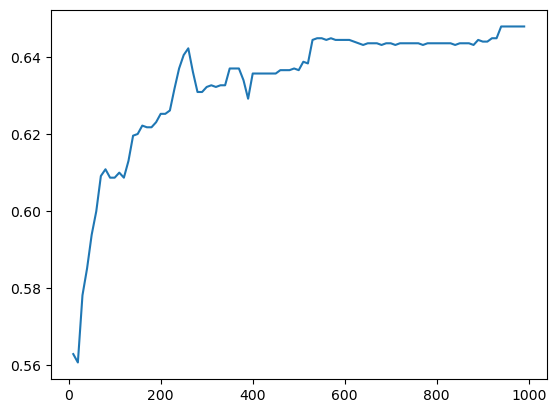

In [163]:
plt.plot(range(10,1000,10),acc)

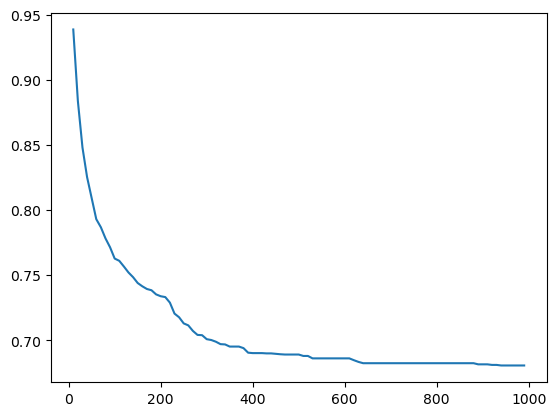

In [164]:
plt.plot(range(10,1000,10),train)

In [145]:
acc=[]
for i in range(1,100,1):
    forest=RandomForestClassifier(n_estimators=i)
    forest.fit(x_train,label_train)
    pred=forest.predict(x_predict)
    acc.append(accuracy_score(label_predict,pred))


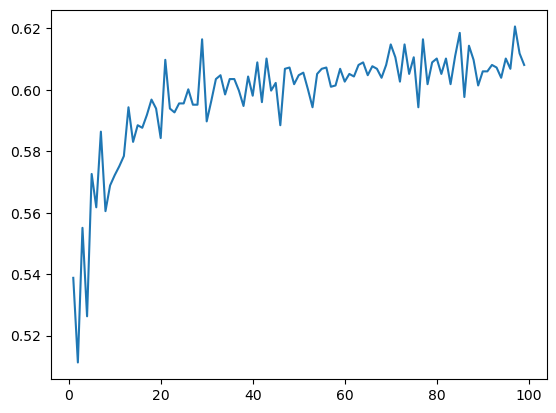

In [146]:
plt.plot(range(1,100,1),acc)

## Prova con Iris dataset 

In [9]:
col_names = ['Sepal_Length','Sepal_Width','Petal_Length','Petal_Width','Class']
iris= pd.read_csv("/home/lenovo/Scrivania/Lab_Machine_Learning/Progetto/iris.data",names=col_names)
iris.shape
iris.head(10)

,Sepal_Length,Sepal_Width,Petal_Length,Petal_Width,Class
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
5,5.4,3.9,1.7,0.4,Iris-setosa
6,4.6,3.4,1.4,0.3,Iris-setosa
7,5.0,3.4,1.5,0.2,Iris-setosa
8,4.4,2.9,1.4,0.2,Iris-setosa
9,4.9,3.1,1.5,0.1,Iris-setosa


In [16]:
iris['Class'].replace(['Iris-setosa','Iris-versicolor','Iris-virginica'],[0,1,2], inplace=True)

In [18]:
tree=DecisionTreeClassifier()
iris=iris.sample(frac=1)
x=iris.iloc[:,:4]
label=iris.Class

In [19]:
x_train,x_predict,label_train,label_predict=train_test_split(x,label,test_size=0.2)

In [34]:
tree.fit(x_train,label_train)
pred=tree.predict(x_predict)
pred

array([0, 0, 2, 1, 0, 2, 0, 1, 2, 2, 1, 0, 2, 2, 1, 0, 0, 2, 1, 1, 2, 1,
       0, 0, 2, 0, 2, 0, 1, 2, 0, 1, 0, 2, 0, 1, 2, 2, 1, 2, 0, 1, 1, 2,
       1])

In [22]:
print(confusion_matrix(label_predict,pred))
print(classification_report(label_predict,pred))
print(accuracy_score(label_predict,pred))

[[ 9  0  0]
 [ 0 11  1]
 [ 0  0  9]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         9
           1       1.00      0.92      0.96        12
           2       0.90      1.00      0.95         9

    accuracy                           0.97        30
   macro avg       0.97      0.97      0.97        30
weighted avg       0.97      0.97      0.97        30

0.9666666666666667


In [215]:
tree=DecisionTreeClassifier(min_samples_split=50)
iris=iris.sample(frac=1)
x=iris.iloc[:,:4]
label=iris.Class
x_train,x_predict,label_train,label_predict=train_test_split(x,label,test_size=0.3)
acc=[]
for i in range(20,60,1):
    tree=DecisionTreeClassifier(min_samples_split=i)
    tree.fit(x_train,label_train)
    pred=tree.predict(x_predict)
    acc.append(accuracy_score(label_predict,pred))
    
train=[]
for i in range(20,60,1):
    tree=DecisionTreeClassifier(min_samples_split=i)
    tree.fit(x_train,label_train)
    pred=tree.predict(x_train)
    train.append(accuracy_score(label_train,pred))

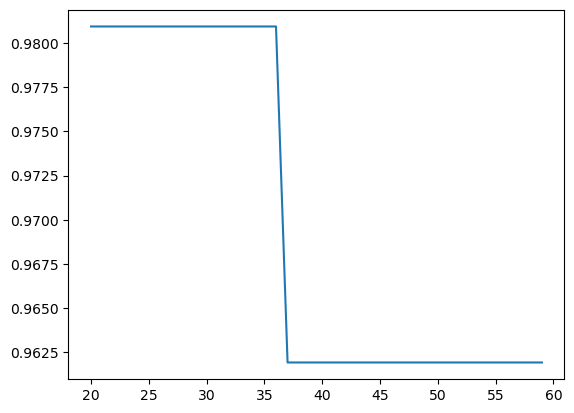

In [217]:
plt.plot(range(20,60,1),train)

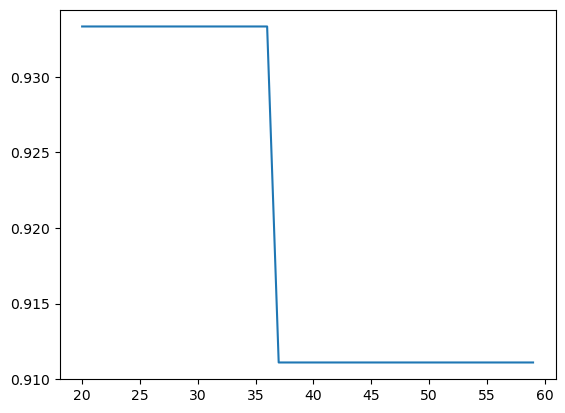

In [216]:
plt.plot(range(20,60,1),acc)

## KK-nearest 

In [67]:
tree=KNeighborsClassifier(n_neighbors=30)
df1=df.sample(frac=1)
x=df1.iloc[:,4:]
label=df1.HOME_TEAM_WINS

In [68]:
x_train,x_predict,label_train,label_predict=train_test_split(x,label,test_size=0.2)

In [69]:
tree.fit(x_train,label_train)
pred=tree.predict(x_predict)
pred

array([1, 0, 0, ..., 1, 1, 1])

In [70]:
print(confusion_matrix(label_predict,pred))
print(classification_report(label_predict,pred))
print(accuracy_score(label_predict,pred))

[[ 344  617]
 [ 296 1033]]
              precision    recall  f1-score   support

           0       0.54      0.36      0.43       961
           1       0.63      0.78      0.69      1329

    accuracy                           0.60      2290
   macro avg       0.58      0.57      0.56      2290
weighted avg       0.59      0.60      0.58      2290

0.6013100436681222


In [65]:
tree=KNeighborsClassifier(n_neighbors=20)
df1=df.sample(frac=1)
x=df1.iloc[:,4:]
label=df1.HOME_TEAM_WINS
x_train,x_predict,label_train,label_predict=train_test_split(x,label,test_size=0.3)
acc=[]
for i in range(1,30,1):
    tree=KNeighborsClassifier(n_neighbors=i)
    tree.fit(x_train,label_train)
    pred=tree.predict(x_predict)
    acc.append(accuracy_score(label_predict,pred))
    
train=[]
for i in range(1,30,1):
    tree=KNeighborsClassifier(n_neighbors=i)
    tree.fit(x_train,label_train)
    pred=tree.predict(x_train)
    train.append(accuracy_score(label_train,pred))

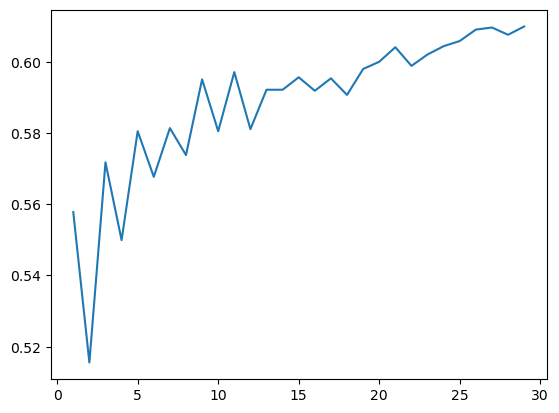

In [66]:
plt.plot(range(1,30,1),acc)

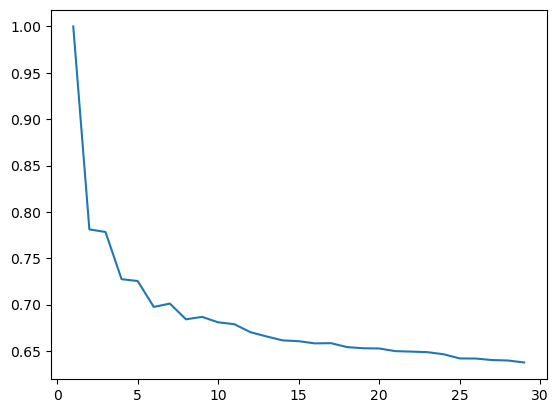

In [72]:
plt.plot(range(1,30,1),train)

## SVM

In [91]:
tree=SVC()
df1=df.sample(frac=1)
x=df1.iloc[:,4:]
label=df1.HOME_TEAM_WINS
x_train,x_predict,label_train,label_predict=train_test_split(x,label,test_size=0.2)

In [92]:
tree.fit(x_train,label_train)
pred=tree.predict(x_predict)
pred

array([1, 1, 1, ..., 1, 1, 1])

In [93]:
print(confusion_matrix(label_predict,pred))
print(classification_report(label_predict,pred))
print(accuracy_score(label_predict,pred))

[[   1  920]
 [   0 1369]]
              precision    recall  f1-score   support

           0       1.00      0.00      0.00       921
           1       0.60      1.00      0.75      1369

    accuracy                           0.60      2290
   macro avg       0.80      0.50      0.38      2290
weighted avg       0.76      0.60      0.45      2290

0.5982532751091703


## Assesment

In [9]:
trees=DecisionTreeClassifier(min_samples_split=50)
forest=RandomForestClassifier(n_estimators=100)
df2=df.sample(frac=1)
x=df2.iloc[:,4:]
label=df2.HOME_TEAM_WINS
w=len(label[label[:]==0])
l=len(label[label[:]!=0])
print(l/(l+w))

0.5875622325093894


In [10]:
x_train,x_predict,label_train,label_predict=train_test_split(x,label,test_size=0.2,stratify=label)

In [11]:
forest.fit(x_train,label_train)
forest_prob=forest.predict_proba(x_predict)
trees.fit(x_train,label_train)
tree_prob=trees.predict_proba(x_predict)

In [12]:
def roc_curve(y_true, y_prob, thresholds):

    fpr = []
    tpr = []

    for threshold in thresholds:

        y_pred = np.where(y_prob[:,1] >= threshold, 1,0)

        fp = np.sum((y_pred == 1) & (y_true == 0))
        tp = np.sum((y_pred == 1) & (y_true == 1))

        fn = np.sum((y_pred == 0) & (y_true == 1))
        tn = np.sum((y_pred == 0) & (y_true == 0))

        fpr.append(fp / (fp + tn))
        tpr.append(tp / (tp + fn))

    return [fpr, tpr]

In [29]:
Tresholds=np.arange (0.1, 1, 0.001)
x,y=roc_curve(label_predict,forest_prob,Tresholds)
fnr=1-np.array(y)

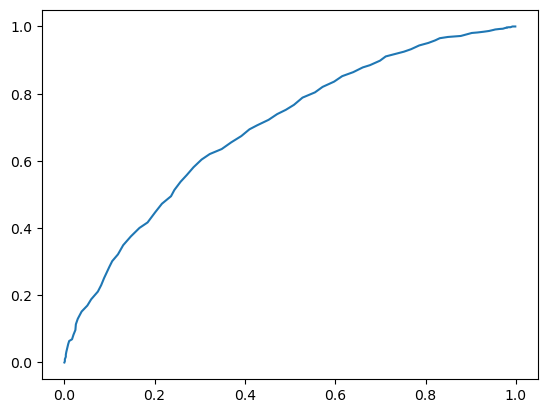

In [30]:
plt.plot(x,y)

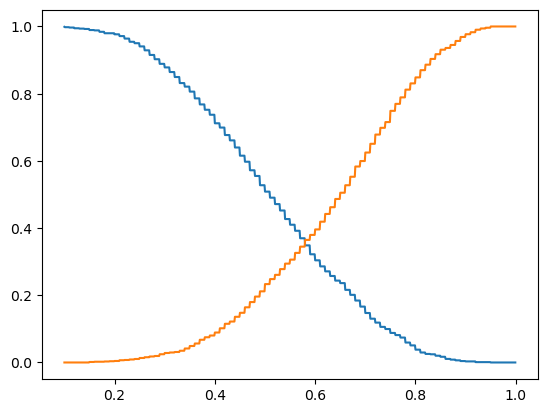

In [31]:
plt.plot(Tresholds,x)
plt.plot(Tresholds,fnr)

In [13]:
Tresholds=np.arange (0.1, 1, 0.001)
x_t,y_t=roc_curve(label_predict,tree_prob,Tresholds)
fnr_t=1-np.array(y_t)

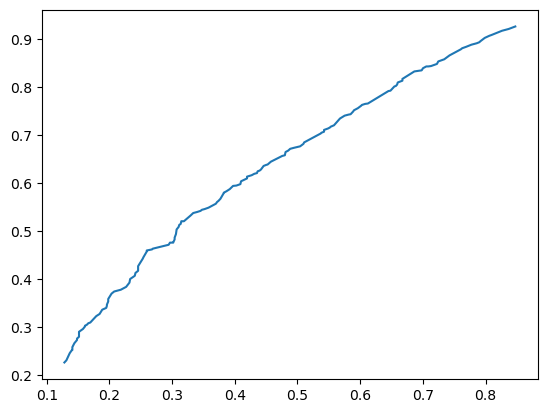

In [14]:
plt.plot(x_t,y_t)

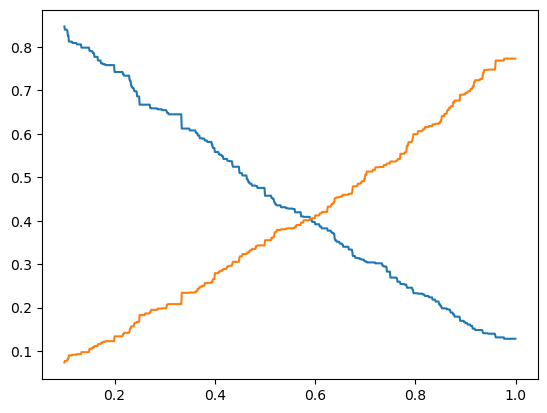

In [15]:
plt.plot(Tresholds,x_t)
plt.plot(Tresholds,fnr_t)

In [35]:
trees_5=DecisionTreeClassifier(max_depth=4)
forest_5=RandomForestClassifier(n_estimators=100)
df2=df5.sample(frac=1)
x_5=df2.iloc[:,5:]
label_5=df2.HOME_TEAM_WINS
w=len(label[label[:]==0])
l=len(label[label[:]!=0])
print(l/(l+w))

0.5875622325093894


In [36]:
x_train_5,x_predict_5,label_train_5,label_predict_5=train_test_split(x_5,label_5,test_size=0.2)

In [37]:
forest_5.fit(x_train_5,label_train_5)
forest_prob_5=forest_5.predict_proba(x_predict_5)
trees_5.fit(x_train_5,label_train_5)
tree_prob_5=trees_5.predict_proba(x_predict_5)

In [38]:
Tresholds=np.arange (0.1, 1, 0.001)
x_5,y_5=roc_curve(label_predict_5,forest_prob_5,Tresholds)
fnr_5=1-np.array(y_5)

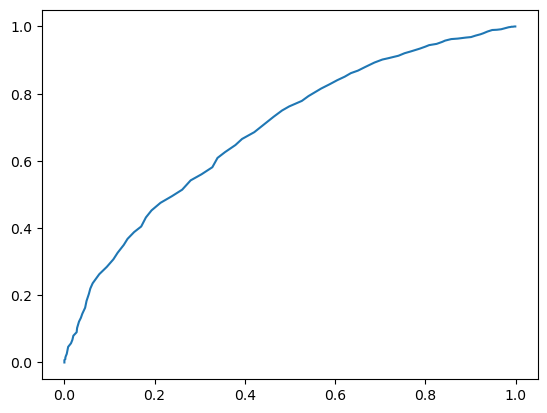

In [39]:
plt.plot(x_5,y_5)

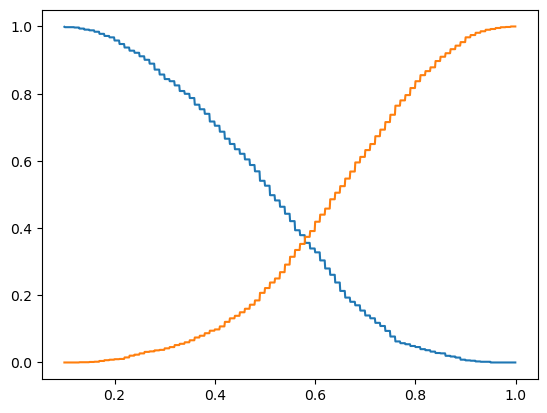

In [40]:
plt.plot(Tresholds,x_5)
plt.plot(Tresholds,fnr_5)

In [42]:
AUC=auc(x,y)
AUC_5=auc(x_5,y_5)
AUC_T=auc(x_t,y_t)
print(AUC)
print(AUC_5)
print(AUC_T)

0.6962582951368775
0.6913419160287636
0.6935958237842195


In [45]:
forest=RandomForestClassifier()
trees=DecisionTreeClassifier(max_depth=5)
df2=df.sample(frac=1)
x=df2.iloc[:,4:]
label=df2.HOME_TEAM_WINS
df2=df5.sample(frac=1)
x_5=df2.iloc[:,5:]
label_5=df2.HOME_TEAM_WINS

In [46]:
scores=cross_val_score(forest,x,label,scoring='roc_auc')

In [47]:
print(scores.mean())
print(scores.std())

0.7013812541635208
0.008275576813293266


In [49]:
scores=cross_val_score(trees,x,label,scoring='roc_auc')

In [50]:
print(scores.mean())
print(scores.std())

0.6910082153871506
0.0066896976262911445


In [402]:
forest=RandomForestClassifier()

In [403]:
scores=cross_val_score(forest,x_5,label_5,scoring='roc_auc')

In [404]:
print(scores.mean())
print(scores.std())

0.6962671096261792
0.01616007820724168


In [413]:
scores=cross_val_score(trees,x,label,scoring='roc_auc')

In [414]:
print(scores.mean())
print(scores.std())

0.694270627364289
0.016297973116692115
